### Read and explore the datasets

In [180]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly.offline
import plotly_express as px
import warnings
import plotly.plotly as py
import plotly.graph_objs as go
warnings.filterwarnings('ignore')


#init_notebook_mode
# pip install cufflinks
# pip install plotly_express
# cufflinks.__version__
# pip install cufflinks --upgrade
# pip install python-quilt
# pip install missingno

In [181]:
#Read datasets, no description available. ALl files available at 
# http://www.tsb.gc.ca/eng/stats/aviation/data-5.html. Adding conditions as warning
# received: Columns (+30 in total)have mixed types. Specify dtype option on 
# import or set low_memory=False.
#movements source: https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=2310001801


df1 = pd.read_csv('ASISdb_MDOTW_VW_OCCURRENCE_PUBLIC.csv') 
#                   sep=',', error_bad_lines=False, index_col=False, dtype='unicode')
df2 = pd.read_csv('ASISdb_MDOTW_VW_AIRCRAFT_PUBLIC.csv')
#                  sep=',', error_bad_lines=False, index_col=False, dtype='unicode')
df3 = pd.read_csv('ASISdb_MDOTW_VW_EVENTS_AND_PHASES_PUBLIC.csv')
#df4 = pd.read_csv('ASISdb_MDOTW_VW_SURVIVABILITY_PUBLIC.csv')
dfo = pd.read_csv('23100018.csv')


#### Full definition of contents  <http://www.tsb.gc.ca/eng/stats/aviation/2016/ssea-ssao-2016.html>
<script src="http://www.tsb.gc.ca/includes/js/i18n/en.min.js"></script>

In [182]:
#Rename occid
df2 = df2.rename(index=str, columns={"occid": "OccID"})

In [183]:
df2.shape

(57227, 194)

In [184]:
df1.shape

(47226, 246)

In [185]:
df1.head()

,OccID,OccNo,AirportID,AirportID_AirportName,AirportID_CountryID,AirportID_CountryID_DisplayEng,AirportID_CountryID_DisplayFre,Airport_ProvinceID,AirportID_ProvinceID_DisplayEng,AirportID_ProvinceID_DisplayFre,...,InitialPositionEnum_DisplayFre,FinalPositionEnum,FinalPositionEnum_DisplayEng,FinalPositionEnum_DisplayFre,FullProcedureIND,FullProcedureIND_DisplayEng,FullProcedureIND_DisplayFre,SurfaceContaminationID,SurfaceContaminationID_DisplayEng,SurfaceContaminationID_DisplayFre
0,152828,A19P0071,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,152826,A19P0070,109.0,(CAMPBELL ISLAND),2.0,CANADA,CANADA,12.0,BRITISH COLUMBIA,COLOMBIE-BRITANNIQUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,152825,A19P0069,1912.0,Vancouver Intl,2.0,CANADA,CANADA,12.0,BRITISH COLUMBIA,COLOMBIE-BRITANNIQUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [186]:
df3.shape

(105506, 14)

### Finding unique values on datasets

In [187]:
df1u = df1.OccID.nunique()

In [188]:
df2u = df2.OccID.nunique()

In [189]:
df3u = df3.OccID.nunique()

In [190]:
unique_ = pd.DataFrame({'Dataset' :["AC","EVE", "PHA"],#"OCC","SUR"], 
                        "Unique":[df1u,df2u, df3u]})
unique_.sort_values(by="Unique", ascending=False)

,Dataset,Unique
0,AC,43855
1,EVE,43854
2,PHA,43814


### Merging the three datasets with relevant information

In [191]:
# dfm = df1.merge(df2, how='left', left_on=('OccID'), right_on=('OccID'))
# .merge(df3, how='left', left_on=('OccID'), right_on=('OccID')) 

In [192]:
from functools import reduce
dfs = [df1,df2,df3]
dfm = reduce(lambda left,right: pd.merge(left,right, on='OccID'), dfs)

In [193]:
dfm #dfm.TotalFatalCount

,OccID,OccNo_x,AirportID,AirportID_AirportName,AirportID_CountryID,AirportID_CountryID_DisplayEng,AirportID_CountryID_DisplayFre,Airport_ProvinceID,AirportID_ProvinceID_DisplayEng,AirportID_ProvinceID_DisplayFre,...,EventPhaseSequence,EventID_DisplayEng,EventID_DisplayFre,FullEventDescEng,FullEventDescFre,PhaseID,PhaseID_DisplayEng,PhaseID_DisplayFre,FullPhaseDescEng,FullPhaseDescFre
0,152828,A19P0071,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Flight crew incapacitation/illness/medical issue,Maladie/Incapacité de l'équipage de conduite,[Aircraft operation general].[Flight crew].[Fl...,[Exploitation de l'aéronef - général].[Équipag...,184.0,Cruise,Croisière,[POWERED FIXED-WING AIRCRAFT].[En-route].[Cruise],[Aéronef à voilure fixe - motorisé].[En route]...
1,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Smoke - Passenger cabin,Fumée - Cabine passagers,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
2,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,2,Smoke - Cockpit,Fumée - Poste de pilotage,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
3,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,3,Smoke - APU,Fumée - APU,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
4,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,4,Declared Emergency/Priority/ARFF Standby,Déclaration d'une urgence,[Consequential events].[Declared Emergency/Pri...,"[Evénements résultants, conséquences].[Déclara...",211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
5,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Smoke - Passenger cabin,Fumée - Cabine passagers,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
6,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,2,Smoke - Cockpit,Fumée - Poste de pilotage,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
7,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,3,Smoke - APU,Fumée - APU,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
8,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,4,Declared Emergency/Priority/ARFF Standby,Déclaration d'une urgence,[Consequential events].[Declared Emergency/Pri...,"[Evénements résultants, conséquences].[Déclara...",211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
9,152826,A19P0070,109.0,(CAMPBELL ISLAND),2.0,CANADA

### Preprocessing dataset with information about movements

In [194]:
dfo.columns

Index(['REF_DATE', 'GEO', 'DGUID', 'Class of operation',
       'Rank and number of movements', 'UOM', 'UOM_ID', 'SCALAR_FACTOR',
       'SCALAR_ID', 'VECTOR', 'COORDINATE', 'VALUE', 'STATUS', 'SYMBOL',
       'TERMINATED', 'DECIMALS'],
      dtype='object')

In [195]:
mov = dfo.groupby(['REF_DATE','GEO', 'Class of operation', 'VALUE'])

In [196]:
mov.first()

DGUID  \
REF_DATE GEO                                                Class of operation                   VALUE                  
1997     Abbotsford, British Columbia                       Itinerant movements                  18               NaN   
                                                                                                 56769            NaN   
                                                            Local movements                      5                NaN   
                                                                                                 79369            NaN   
                                                            Total, itinerant and local movements 12               NaN   
                                                                                                 136138           NaN   
         Alberta                                            Itinerant movements                  452402   2016A000248   
                                                            Local movements                      175239   2016A000248   
                                                            Total, itinerant and local movements 627641   2016A000248   
         Boundary Bay, British Columbia                     Itinerant movements                  14               NaN   
                                                                                                 68630            NaN   
                                                            Local movements                      1                NaN   
                                                                                                 139509           NaN   
                                                            Total, itinerant and local movements 4                NaN   
                                                                                                 208139           NaN   
         British Columbia                                   Itinerant movements                  784723   2016A000259   
                                                            Local movements                      443831   2016A000259   
                                                            Total, itinerant and local movements 1228554  2016A000259   
         Calgary International, Alberta                     Itinerant movements                  3                NaN   
                                                                                                 224561           NaN   
                                                            Local movements                      37               NaN   
                                                                                                 14397            NaN   
                                                            Total, itinerant and local movements 3                NaN   
                                                                                                 238958           NaN   
         Calgary/Springbank, Alberta                        Itinerant movements                  27               NaN   
                                                                                                 41491            NaN   
                                                            Local movements                      3                NaN   
                                                                                                 87107            NaN   
                                                            Total, itinerant and local movements 13               NaN   
                                                                                                 128598           NaN   
...                                                                                                               ...   
2018     Whitehorse International, Yukon                    Local movements                      14170            NaN  

In [197]:
# Get 'Total Canadian Airports' movements per year

# mov = (dfo[dfo['REF_DATE'].notnull() & (dfo['GEO']=='Total Canadian Airports') &
#     (dfo['Class of operation']=='Total, itinerant and local movements')]), (dfo['VALUE'])

mov = (dfo[dfo['REF_DATE'].notnull() & (dfo['GEO']=='Total Canadian Airports') &
    (dfo['Class of operation']=='Total, itinerant and local movements')]), (dfo['REF_DATE'], dfo['VALUE'])
           
print (mov)

(Empty DataFrame
Columns: [REF_DATE, GEO, DGUID, Class of operation, Rank and number of movements, UOM, UOM_ID, SCALAR_FACTOR, SCALAR_ID, VECTOR, COORDINATE, VALUE, STATUS, SYMBOL, TERMINATED, DECIMALS]
Index: [], (0       1997
1       1997
2       1997
3       1997
4       1997
5       1997
6       1997
7       1997
8       1997
9       1997
10      1997
11      1997
12      1997
13      1997
14      1997
15      1997
16      1997
17      1997
18      1997
19      1997
20      1997
21      1997
22      1997
23      1997
24      1997
25      1997
26      1997
27      1997
28      1997
29      1997
        ... 
6330    2018
6331    2018
6332    2018
6333    2018
6334    2018
6335    2018
6336    2018
6337    2018
6338    2018
6339    2018
6340    2018
6341    2018
6342    2018
6343    2018
6344    2018
6345    2018
6346    2018
6347    2018
6348    2018
6349    2018
6350    2018
6351    2018
6352    2018
6353    2018
6354    2018
6355    2018
6356    2018
6357    2018
6358    2018
6359 

In [198]:
dfm.shape

(181464, 452)

In [199]:
dfm.head()

,OccID,OccNo_x,AirportID,AirportID_AirportName,AirportID_CountryID,AirportID_CountryID_DisplayEng,AirportID_CountryID_DisplayFre,Airport_ProvinceID,AirportID_ProvinceID_DisplayEng,AirportID_ProvinceID_DisplayFre,...,EventPhaseSequence,EventID_DisplayEng,EventID_DisplayFre,FullEventDescEng,FullEventDescFre,PhaseID,PhaseID_DisplayEng,PhaseID_DisplayFre,FullPhaseDescEng,FullPhaseDescFre
0,152828,A19P0071,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Flight crew incapacitation/illness/medical issue,Maladie/Incapacité de l'équipage de conduite,[Aircraft operation general].[Flight crew].[Fl...,[Exploitation de l'aéronef - général].[Équipag...,184.0,Cruise,Croisière,[POWERED FIXED-WING AIRCRAFT].[En-route].[Cruise],[Aéronef à voilure fixe - motorisé].[En route]...
1,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,1,Smoke - Passenger cabin,Fumée - Cabine passagers,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
2,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,2,Smoke - Cockpit,Fumée - Poste de pilotage,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
3,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,3,Smoke - APU,Fumée - APU,[Aircraft/system/component related event (Airc...,[Evénement aéronef/système/composant (Aéronef/...,211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...
4,152827,A19W0070,1984.0,Erik Nielsen Intl,2.0,CANADA,CANADA,24.0,YUKON,YUKON,...,4,Declared Emergency/Priority/ARFF Standby,Déclaration d'une urgence,[Consequential events].[Declared Emergency/Pri...,"[Evénements résultants, conséquences].[Déclara...",211.0,Standing : Engine(s) Shut Down,Stationné - arrêt du moteur,[POWERED FIXED-WING AIRCRAFT].[Standing].[Stan...,[Aéronef à voilure fixe - motorisé].[Stationne...


In [200]:
# Drop duplicates

dfm = dfm.sort_values("OccID", ascending=True)
dfm = dfm.drop_duplicates(subset ="OccID") 
#df.dropna(inplace = True)

In [201]:
dfm.shape

(43814, 452)

In [202]:
dfm.isnull().sum()
#dropped the nulls and update the dataframe
# dfm.shape

OccID                                      0
OccNo_x                                    0
AirportID                              26500
AirportID_AirportName                  26500
AirportID_CountryID                    26500
AirportID_CountryID_DisplayEng         26500
AirportID_CountryID_DisplayFre         26500
Airport_ProvinceID                     26920
AirportID_ProvinceID_DisplayEng        26920
AirportID_ProvinceID_DisplayFre        26920
Location                               26500
Latitude                                1330
LatEnum                                 1332
LatEnum_DisplayEng                      1332
LatEnum_DisplayFre                      1332
Longitude                               1326
LongEnum                                1517
LongEnum_DisplayEng                     1517
LongEnum_DisplayFre                     1517
ICAO                                   26500
BearingID                              41378
BearingID_Abbr                         41378
BearingID_

In [203]:
dfm.shape

(43814, 452)

In [204]:
dfm.dtypes

OccID                                    int64
OccNo_x                                 object
AirportID                              float64
AirportID_AirportName                   object
AirportID_CountryID                    float64
AirportID_CountryID_DisplayEng          object
AirportID_CountryID_DisplayFre          object
Airport_ProvinceID                     float64
AirportID_ProvinceID_DisplayEng         object
AirportID_ProvinceID_DisplayFre         object
Location                                object
Latitude                               float64
LatEnum                                float64
LatEnum_DisplayEng                      object
LatEnum_DisplayFre                      object
Longitude                              float64
LongEnum                               float64
LongEnum_DisplayEng                     object
LongEnum_DisplayFre                     object
ICAO                                    object
BearingID                              float64
BearingID_Abb

In [205]:
dfm.columns

Index(['OccID', 'OccNo_x', 'AirportID', 'AirportID_AirportName',
       'AirportID_CountryID', 'AirportID_CountryID_DisplayEng',
       'AirportID_CountryID_DisplayFre', 'Airport_ProvinceID',
       'AirportID_ProvinceID_DisplayEng', 'AirportID_ProvinceID_DisplayFre',
       ...
       'EventPhaseSequence', 'EventID_DisplayEng', 'EventID_DisplayFre',
       'FullEventDescEng', 'FullEventDescFre', 'PhaseID', 'PhaseID_DisplayEng',
       'PhaseID_DisplayFre', 'FullPhaseDescEng', 'FullPhaseDescFre'],
      dtype='object', length=452)

### Visualization

In [206]:
#importing plotly and cufflinks in offline mode
import plotly as py
import cufflinks as cf
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import download_plotlyjs
from plotly.offline import init_notebook_mode
from plotly.offline import plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
import geopandas as gp
import matplotlib.pyplot as plt
import descartes
from shapely.geometry import Point, Polygon
%matplotlib inline

In [207]:
# import labelencoder
from sklearn.preprocessing import LabelEncoder

In [208]:
dfm.OccDate

181463     1/9/1976 12:00:00 AM
181461    1/19/1976 12:00:00 AM
181460    2/13/1976 12:00:00 AM
181455    2/16/1976 12:00:00 AM
181453    2/25/1976 12:00:00 AM
181450     3/4/1976 12:00:00 AM
181448     5/5/1976 12:00:00 AM
181446    5/29/1976 12:00:00 AM
181444     6/4/1976 12:00:00 AM
181443     6/5/1976 12:00:00 AM
181442     6/6/1976 12:00:00 AM
181441     6/5/1976 12:00:00 AM
181440    5/24/1976 12:00:00 AM
181438    6/19/1976 12:00:00 AM
181437    6/27/1976 12:00:00 AM
181435    7/18/1976 12:00:00 AM
181434    7/19/1976 12:00:00 AM
181431    7/22/1976 12:00:00 AM
181430    7/29/1976 12:00:00 AM
181429    7/31/1976 12:00:00 AM
181428     8/8/1976 12:00:00 AM
181427    8/12/1976 12:00:00 AM
181426    8/13/1976 12:00:00 AM
181424    8/16/1976 12:00:00 AM
181423    8/22/1976 12:00:00 AM
181421    9/13/1976 12:00:00 AM
181420    9/14/1976 12:00:00 AM
181419    9/18/1976 12:00:00 AM
181417    9/19/1976 12:00:00 AM
181415    9/23/1976 12:00:00 AM
                  ...          
160     

In [209]:
#Casting OccDate as string for visualization

dfm['OccDate'] = dfm['OccDate'].astype(str)

In [210]:
dfm['OccDate'] = pd.to_datetime(dfm['OccDate'])

In [211]:
# dfm.OccDate.dt.year

In [212]:
# dfm['OccDate'] = le.fit_transform(dfm['OccDate'].astype(str))

In [213]:
dfm.shape

(43814, 452)

In [214]:
#Drop duplicates

dfm.duplicated(subset=None, keep="first").sum()
#found two duplicates
dfm.shape

(43814, 452)

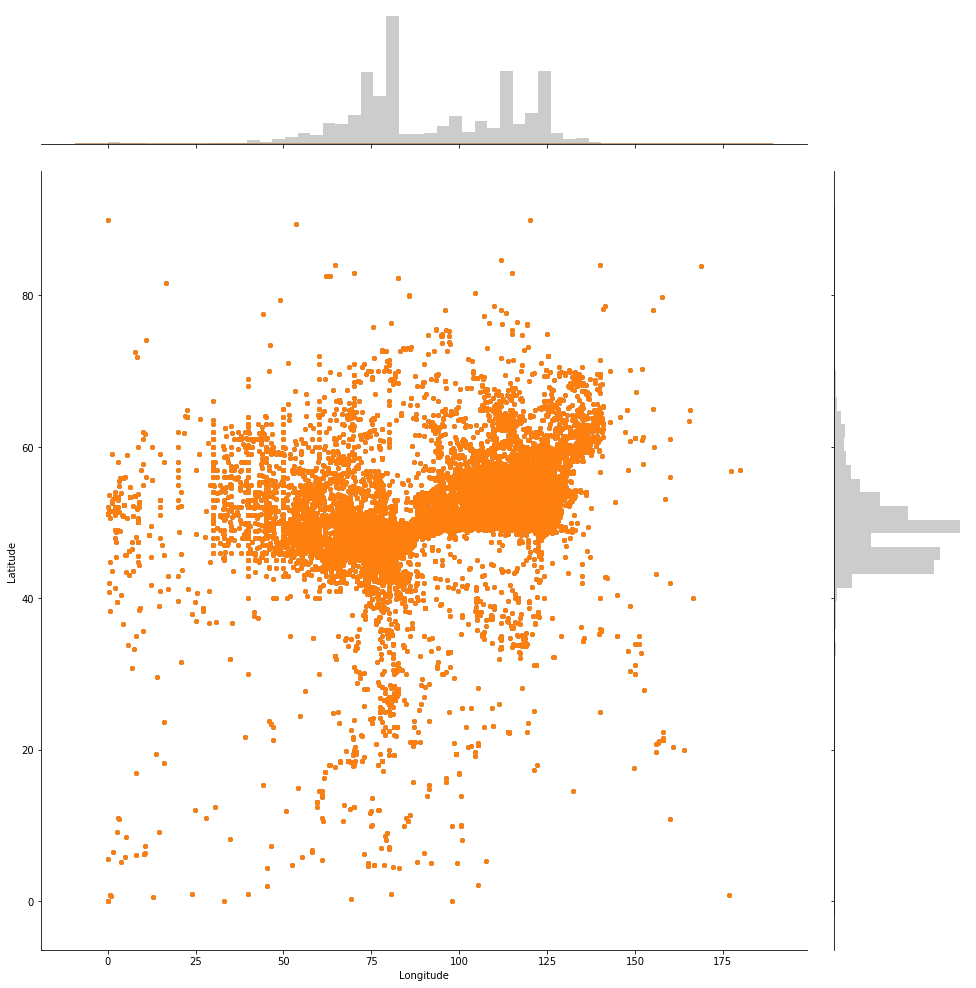

In [269]:
coords = dfm

g = sns.JointGrid('Longitude', "Latitude", coords)
g = g.plot_marginals(sns.distplot, kde=False, color="grey")
g.fig.set_size_inches(15,15)

for i, v in coords.groupby("OccTypeID"):
    sns.kdeplot(coords["Longitude"], ax=g.ax_marg_x, legend=False)
    sns.kdeplot(coords["Latitude"], ax=g.ax_marg_y, vertical=True, legend=False)
    g.ax_joint.plot(coords["Longitude"], coords["Latitude"], "o", ms=4)



In [216]:
#Long = dfm.Longitude + 6200000

In [217]:
#Lat = dfm.Latitude + 3000000

In [218]:
can_map0 = gp.read_file('C:/Users/fjbel/Google Drive/RoboG/Aviation Project/TSB_Aviation_Accidents_APR2019/lpr_000b16a_e/lpr_000b16a_e.shp')

In [219]:
dfm.columns

Index(['OccID', 'OccNo_x', 'AirportID', 'AirportID_AirportName',
       'AirportID_CountryID', 'AirportID_CountryID_DisplayEng',
       'AirportID_CountryID_DisplayFre', 'Airport_ProvinceID',
       'AirportID_ProvinceID_DisplayEng', 'AirportID_ProvinceID_DisplayFre',
       ...
       'EventPhaseSequence', 'EventID_DisplayEng', 'EventID_DisplayFre',
       'FullEventDescEng', 'FullEventDescFre', 'PhaseID', 'PhaseID_DisplayEng',
       'PhaseID_DisplayFre', 'FullPhaseDescEng', 'FullPhaseDescFre'],
      dtype='object', length=452)

In [220]:
# fig, ax = plt.subplots(figsize = (15,15))
# can_map0.plot(ax=ax)

In [221]:
can_map1 = gp.read_file('C:/Users/fjbel/Google Drive/RoboG/Aviation Project/TSB_Aviation_Accidents_APR2019/gpr_000b11a_e/gpr_000b11a_e.shp')

In [222]:
# fig, ax = plt.subplots(figsize = (15,15))
# can_map1.plot(ax=ax)

In [223]:
geometry = [Point(xy) for xy in zip(Long, dfm['Latitude'])]
geometry[:3]

In [224]:
geo_dfm = gp.GeoDataFrame(dfm, geometry = geometry)
geo_dfm.head

<bound method NDFrame.head of          OccID   OccNo_x  AirportID  \
181463   45001  A76A0002        NaN   
181461   45002  A76A0003        NaN   
181460   45003  A76A0004        NaN   
181455   45004  A76A0005        NaN   
181453   45005  A76A0006        NaN   
181450   45006  A76A0007        NaN   
181448   45007  A76A0008        NaN   
181446   45008  A76A0009        NaN   
181444   45009  A76A0010        NaN   
181443   45010  A76A0011        NaN   
181442   45011  A76A0012        NaN   
181441   45012  A76A0013        NaN   
181440   45013  A76A0014        NaN   
181438   45014  A76A0015        NaN   
181437   45015  A76A0016        NaN   
181435   45016  A76A0017        NaN   
181434   45017  A76A0018        NaN   
181431   45018  A76A0019        NaN   
181430   45019  A76A0020        NaN   
181429   45020  A76A0021        NaN   
181428   45021  A76A0022        NaN   
181427   45022  A76A0023        NaN   
181426   45023  A76A0024        NaN   
181424   45024  A76A0025        Na

In [225]:
#geo_dfm.crs = {'init':'epsg:4326'}

In [226]:
geo_dfm.head()

,OccID,OccNo_x,AirportID,AirportID_AirportName,AirportID_CountryID,AirportID_CountryID_DisplayEng,AirportID_CountryID_DisplayFre,Airport_ProvinceID,AirportID_ProvinceID_DisplayEng,AirportID_ProvinceID_DisplayFre,...,EventID_DisplayEng,EventID_DisplayFre,FullEventDescEng,FullEventDescFre,PhaseID,PhaseID_DisplayEng,PhaseID_DisplayFre,FullPhaseDescEng,FullPhaseDescFre,geometry
181463,45001,A76A0002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Hard landing,Atterrissage dur,[Aircraft operation general].[Aircraft handlin...,[Exploitation de l'aéronef - général].[Conduit...,108.0,Run-on landing,Atterrissage glissé,[HELICOPTER].[Landing].[Run-on landing],[Hélicoptère].[Atterrissage].[Atterrissage gli...,POINT (6200054.83333333 48.05)
181461,45002,A76A0003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Aeroplane flight path deviation,Perte de contrôle ou écart par rapport à la tr...,[Aircraft operation general].[Aeroplane flight...,[Exploitation de l'aéronef - général].[Perte d...,218.0,Take-off run,Roulement au décollage,[POWERED FIXED-WING AIRCRAFT].[Take-off].[Take...,[Aéronef à voilure fixe - motorisé].[Décollage...,POINT (6200064.1 53.56666667)
181460,45003,A76A0004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Collision aircraft-snow bank,Collision d'aéronef avec congère,[Aircraft operation general].[Aircraft - colli...,[Exploitation de l'aéronef - général].[Collisi...,194.0,Landing roll,Roulement à l'atterrissage,[POWERED FIXED-WING AIRCRAFT].[Landing].[Landi...,[Aéronef à voilure fixe - motorisé].[Atterriss...,POINT (6200055.81666667 51.48333333)
181455,45004,A76A0005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Collision aircraft-vehicle,Collision d'aéronef avec véhicule,[Aircraft operation general].[Aircraft - colli...,[Exploitation de l'aéronef - général].[Collisi...,194.0,Landing roll,Roulement à l'atterrissage,[POWERED FIXED-WING AIRCRAFT].[Landing].[Landi...,[Aéronef à voilure fixe - motorisé].[Atterriss...,POINT (6200055.83333333 53.5)
181453,45005,A76A0006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Aeroplane flight path deviation,Perte de contrôle ou écart par rapport à la tr...,[Aircraft operation general].[Aeroplane flight...,[Exploitation de l'aéronef - général].[Perte d...,194.0,Landing roll,Roulement à l'atterrissage,[POWERED FIXED-WING AIRCRAFT].[Landing].[Landi...,[Aéronef à voilure fixe - motorisé].[Atterriss...,POINT (6200060.43333333 53.31666667)


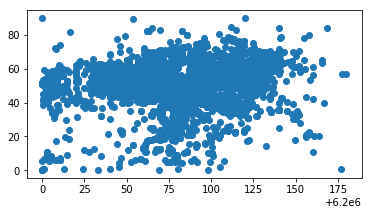

In [227]:
geo_dfm.plot()

In [228]:
Lon = dfm.Longitude * -1

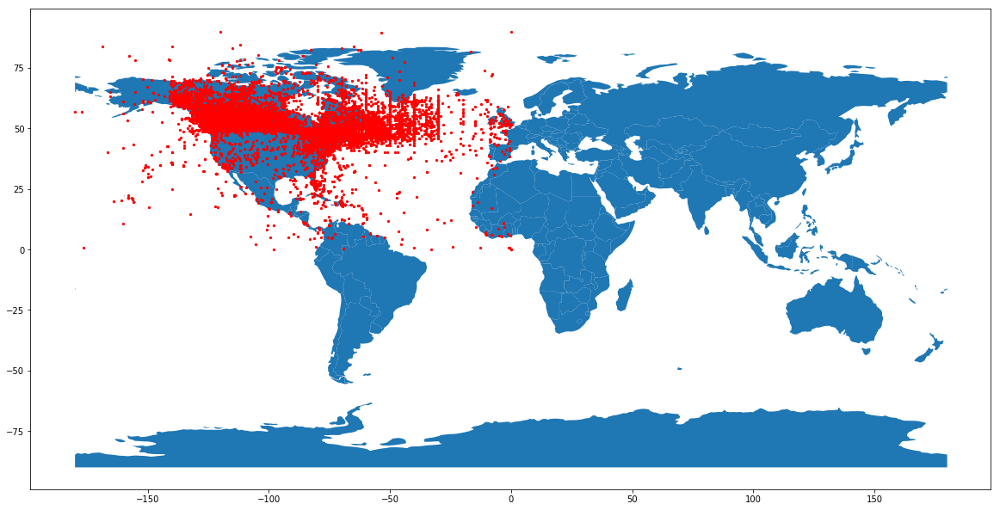

In [229]:
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

geometry = [Point(xy) for xy in zip(dfm.Longitude * -1, dfm['Latitude'])]
gdf = GeoDataFrame(dfm, geometry=geometry)   

#this is a simple map that goes with geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(20, 24)), marker='o', color='red', markersize=5);

(-475628.1754719594,
 9467706.384139618,
 -286761.30475770944,
 5505462.0991403675)

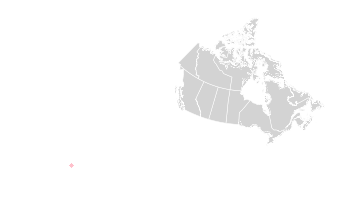

In [230]:
ax = can_map0.plot(color='lightgrey', linewidth=0.5, edgecolor='white', figsize = (5,5))
geo_dfm.plot(markersize=5, color='pink', alpha=0.5, ax=ax)
ax.axis('off')

In [231]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

ValueError: too many values to unpack (expected 2)

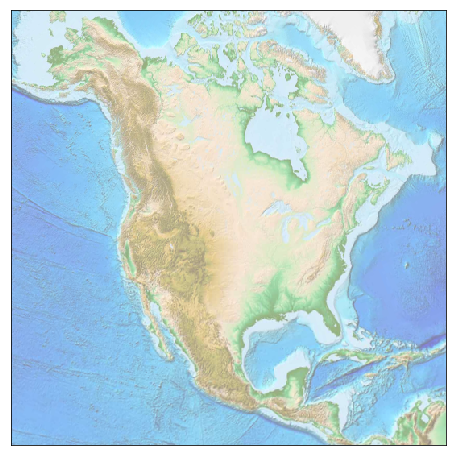

In [270]:
fig = plt.figure(figsize=(8, 8))
m = Basemap(projection='lcc', resolution=None,
            width=8E6, height=8E6, 
            lat_0=45, lon_0=-100,)
m.etopo(scale=0.5, alpha=0.5)

# Map (long, lat) to (x, y) for plotting

for x, y in coords.Longitude, coords.Latitude:
    plt.plot(x, y, 'ok', markersize=5)
    plt.text(x, y, ' Seattle', fontsize=12);
    
    

#x, y = m(dfm['Longitude'], dfm['Latitude'])




In [233]:
#from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot

In [234]:
# data = dict(type = 'cloropleth', locations = ['AZ', 'CA', 'NY'], locationmode = 'USA-states', 
#            colorscale = 'Portland', text = ['text 1', 'text 2', 'text 3'], z = [1.0, 2.0, 3.0],
#            colorbar = {'title': 'Colorbar Title Goes Here'})
# layout = dict(geo = {'scope' : 'usa'})
# choromap = go. Figure(data = [data], layout = layout)
# iplot(choromap)

In [235]:
#Removed as there are few occurrences before 1976
# dfm.OccDate.dt.year.iplot(kind='histogram', bins=40, theme='white', title='Ocurrences per year')

In [236]:
# #Drop prior to 1976
# old = dfm[(dfm.OccDate.dt.year < 1976)].index
# dfm.drop(old, inplace=True)

In [237]:
dfm.OccDate.dt.year.iplot(kind='histogram', bins=50, theme='white', title='Ocurrences per year')

In [238]:
# plt.figure()          
# N = 5
# menMeans = (20, 35, 30, 35, 27)
# menStd = (2, 3, 4, 1, 2)
# width = 0.35       # the width of the bars
# womenMeans = (25, 32, 34, 20, 25)
# womenStd = (3, 5, 2, 3, 3)    
# ind = np.arange(N)
# plt.ylim(0.0, 65.0)
# plt.bar(ind, menMeans, width, color='r', yerr=menStd, label='Men means')
# plt.bar(ind+width, womenMeans, width, color='y', yerr=womenStd, label='Women means')
# plt.ylabel('Bar plot')      

# x = np.linspace(0, N)
# y = np.sin(x)
# axes2 = plt.twinx()
# axes2.plot(x, y, color='k', label='Sine')
# axes2.set_ylim(-1, 1)
# axes2.set_ylabel('Line plot')

# plt.show()

In [239]:
# plt.hist(dfm['OccTypeID_DisplayEng'])

In [240]:
# sns.scatter(x='OccTypeID_DisplayEng', data=df)

In [241]:
#sns.distplot( a=dfm["OccTypeID"], hist=True, kde=False, rug=False )

#px.bar(df, x='OccTypeID_DisplayEng', template='plotly_white')

px.histogram(dfm, x='OperatorTypeID_DisplayEng', color='OccTypeID_DisplayEng',template='plotly')

In [242]:
dfm.OccTypeID_DisplayEng.iplot(kind='histogram', bins=50, theme='white', title='Ocurrences per type')

In [243]:
dfm.PhaseID.fillna(0, inplace=True)

In [244]:
dfm.PhaseID.isna().sum()

0

In [245]:
dfm.PhaseID_DisplayEng=dfm.PhaseID_DisplayEng.astype("str")

In [246]:
# labels = df.PhaseID
# sizes = df.PhaseID.values
# #explode = (0, 0.1, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

# fig1, ax1 = plt.subplots()
# ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
#         shadow=True, startangle=90)
# ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# plt.show()

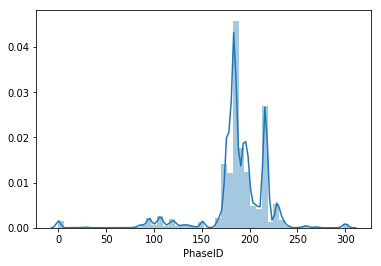

In [247]:
#px.histogram(, x='OrganizationID_DisplayEng', y='OccTypeID_DisplayEng') 
ax = sns.distplot(dfm["PhaseID"])

1


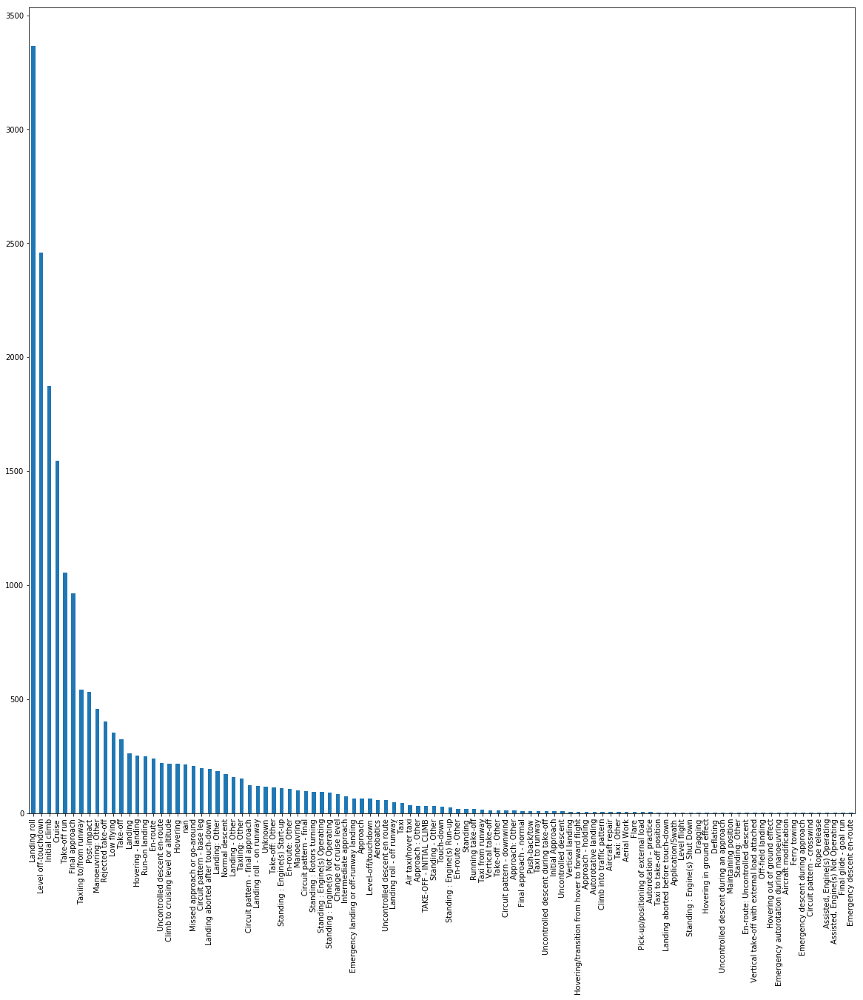

3


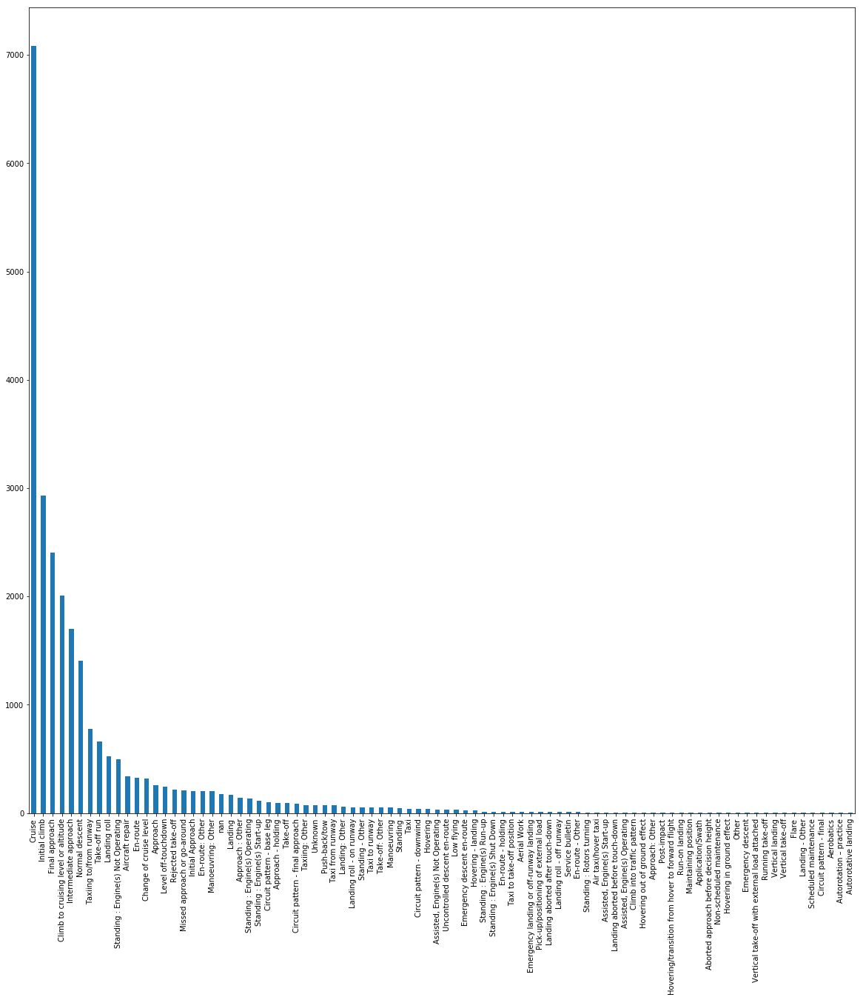

In [271]:
temp=dfm[['PhaseID_DisplayEng', "OccTypeID" ]]
grouper=temp.groupby("OccTypeID")
for i,v in grouper:
    #print(v["PhaseID_DisplayEng"].shape)
    print(i)
    v["PhaseID_DisplayEng"].value_counts().plot.bar(figsize=(20,20))
    plt.show()

In [249]:
temp=dfm[['EventID_DisplayEng', "OccTypeID" ]]
grouper=temp.groupby("OccTypeID")
for i,v in grouper:
    #print(v["PhaseID_DisplayEng"].shape)
    print(v["EventID_DisplayEng"].value_counts())
    #v["EventID_DisplayEng"].value_counts().plot.bar(figsize=(20,200))
    #plt.show()

Aircraft collision - level terrain                              2058
Aeroplane flight path deviation                                 1230
Collision aircraft-tree / tall vegetation                       1072
Hard landing                                                     946
POWER LOSS - FIRST ENGINE                                        868
Main landing gear                                                821
Aeroplane - mush/stall                                           777
Nose gear collapsed/retracted                                    488
Nosed down/overturned                                            465
Aircraft collision - high terrain                                446
Landing gear                                                     425
Aircraft overrun                                                 421
Fire                                                             411
Collision aircraft - cable/wire/powerline                        382
Aircraft - collisions with obstacl

In [250]:
v["EventID_DisplayEng"].value_counts()

Declared Emergency/Priority/ARFF Standby            4138
Diversion - technical reasons                       1617
Separation provision                                1234
INTENTIONAL SHUTDOWN                                 731
POWER LOSS - FIRST ENGINE                            709
Loss of separation: potential collision              666
Smoke                                                663
Hydraulic system                                     522
Flight crew incapacitation/illness/medical issue     515
Landing gear                                         514
Electrical power system                              506
Aircraft - near collisions/loss of separation        460
Aircraft flight control                              435
Loss of separation: risk undetermined                421
Powerplant package                                   418
Aircraft collision - level terrain                   393
Loss of separation: no risk of collision             373
Air Navigation Services        

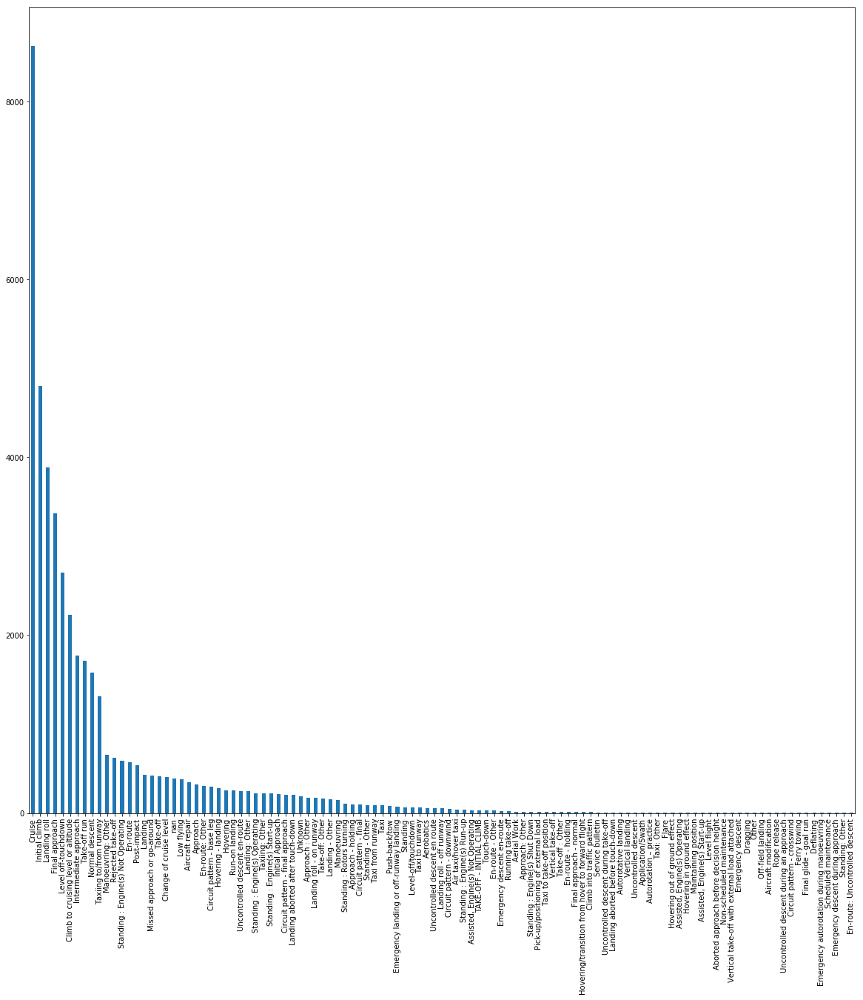

In [251]:
dfm['PhaseID_DisplayEng'].value_counts().plot.bar(figsize=(20,20))

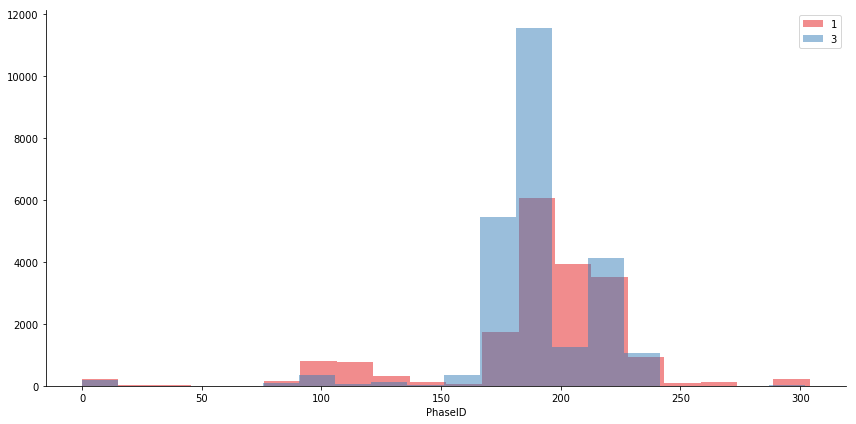

In [252]:
g = sns.FacetGrid(dfm,hue='OccTypeID',palette='Set1',size=6,aspect=2)
g = g.map(plt.hist,'PhaseID',bins=20,alpha=0.5)
plt.legend()

In [253]:
# g = sns.FacetGrid(dfm,hue='AircraftMakeID',palette='Set1',size=8,aspect=2)
# g = g.map(plt.hist,'TotalFatalCount', bins=20,alpha=0.5)
# plt.legend()

In [254]:
#dfen.TotalFatalCount

In [255]:
# dfa.corr('pearson')

In [256]:
px.scatter(dfm, x='TotalFatalCount', y="OrganizationID_DisplayEng", size='TotalFatalCount', size_max=50)
#Get another graph for <100 fatalities

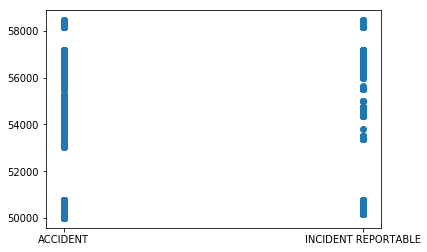

In [257]:
plt.scatter(dfm.OccTypeID_DisplayEng, dfm.AircraftMakeID)
#Get another graph for <100 fatalities

In [263]:
px.scatter_matrix(dfm, dimensions=["PhaseID_DisplayEng",
                                   "AircraftMakeID_DisplayEng"], color = "TotalFatalCount")#"OrganizationID_DisplayEng", "OperatorTypeID_DisplayEng", 

In [259]:
px.scatter(dfm, x="AircraftMakeID_DisplayEng", y="TotalFatalCount", size='TotalFatalCount', size_max=60)

### Preprocessing for classification and clustering

In [78]:
#dfp is a subset of dfm
#dfp.shape, dfm.shape

In [79]:
# need features that can be used to predict an incident/accident before it actually happens
#thus, can not have features like fatality, damagelevelID etc.
features=['AircraftTypeID','AircraftMakeID','OrganizationID', 'OperationTypeID',
           'OperatorTypeID', 'WeightCategoryID','NumberOfEngine', 
          'MaxTakeOffWeight', 'Latitude','Longitude', 'OccTime',
           'WakeTurbulenceCategoryID', 'DangerousGoodEnum','PhaseID']
target=['OccTypeID']

In [80]:
df=dfm[features+target]

In [81]:
df.head()


,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID,OccTypeID
181463,3.0,53063.0,52129.0,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,11:30:00,1.0,2.0,108.0,1
181461,1.0,50371.0,51282.0,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,13:40:00,1.0,2.0,218.0,1
181460,1.0,50669.0,51373.0,3.0,5.0,1.0,1.0,2150.0,51.483333,55.816667,18:30:00,1.0,2.0,194.0,1
181455,1.0,50443.0,51282.0,1.0,5.0,3.0,1.0,8000.0,53.500000,55.833333,10:00:00,2.0,2.0,194.0,1
181453,1.0,50443.0,51282.0,1.0,5.0,2.0,1.0,2313.0,53.316667,60.433333,17:09:00,1.0,2.0,194.0,1


In [82]:
df.PhaseID.isna().sum()

0

In [83]:
df.shape

(43814, 15)

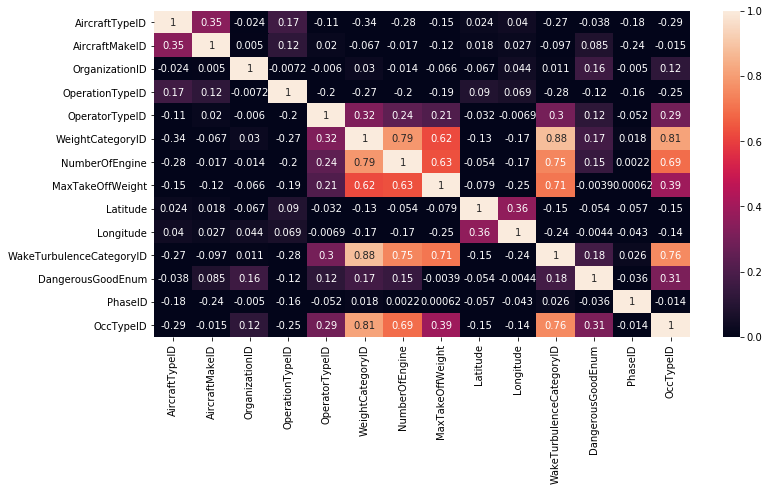

In [84]:
fig, ax = plt.subplots(1, 1, figsize = (12, 6))
sns.heatmap(df.corr(), annot=True, ax = ax, vmin = 0, vmax = 1)

# Checking for duplicates

In [85]:
df.duplicated(subset=None, keep="first").sum()
#found two duplicates
df.shape

(43814, 15)

In [86]:
col=df.columns
df=df.drop_duplicates(col, keep="first")
df.shape
#Removed the duplicates

(43745, 15)

# Find nulls and remove it

In [87]:
df.isnull().sum().sum()
#gives total number of np.nan in the dataframe

24931

In [88]:
df=df.dropna()
#dropped the nulls and update the dataframe
df.shape

(27665, 15)

# Splitting the dataframe in: (feature,target)

In [89]:
x=df[features]
y=df[target]

In [90]:
# Making the target as category
y=y.astype("category")

# TypeCasting the features which are required for our model
x.AircraftTypeID=x.AircraftTypeID.astype("int64")
#x.OccTime=x.OccTime.astype("int64")
x.dtypes

AircraftTypeID                int64
AircraftMakeID              float64
OrganizationID              float64
OperationTypeID             float64
OperatorTypeID              float64
WeightCategoryID            float64
NumberOfEngine              float64
MaxTakeOffWeight            float64
Latitude                    float64
Longitude                   float64
OccTime                      object
WakeTurbulenceCategoryID    float64
DangerousGoodEnum           float64
PhaseID                     float64
dtype: object

In [91]:
from sklearn.preprocessing import LabelEncoder

In [92]:
label_encoder=LabelEncoder()
x["OrganizationID"]=label_encoder.fit_transform(x["OrganizationID"])
x["AircraftTypeID"]=label_encoder.fit_transform(x["AircraftTypeID"])
x["OccTime"]=label_encoder.fit_transform(x["OccTime"])

In [93]:
"""temp=[]
for i in label_encoder.fit_transform(x["AircraftTypeID"]):
    if i not in temp:
        temp.append(i)
temp"""

'temp=[]\nfor i in label_encoder.fit_transform(x["AircraftTypeID"]):\n    if i not in temp:\n        temp.append(i)\ntemp'

In [94]:
#Checking if features need some more work or not?
x.head(2)
#x.dtypes

,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID
181463,2,53063.0,775,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,662,1.0,2.0,108.0
181461,0,50371.0,272,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,792,1.0,2.0,218.0


In [95]:
x.dtypes

AircraftTypeID                int64
AircraftMakeID              float64
OrganizationID                int64
OperationTypeID             float64
OperatorTypeID              float64
WeightCategoryID            float64
NumberOfEngine              float64
MaxTakeOffWeight            float64
Latitude                    float64
Longitude                   float64
OccTime                       int64
WakeTurbulenceCategoryID    float64
DangerousGoodEnum           float64
PhaseID                     float64
dtype: object

In [96]:
len(x.AircraftMakeID.unique())

238

In [97]:
x["AircraftMakeID"]=label_encoder.fit_transform(x["AircraftMakeID"])
_y=y.iloc[:,0].values
clock={}
CLOCK={}
for i, v in enumerate(x["AircraftMakeID"]):
    
    if _y[i]==3:
        if v not in clock.keys():
            clock[v]=1
        elif v in clock.keys():
            clock[v]=clock[v]+1
        else:
            print("weird")
        if v not in CLOCK.keys():
            CLOCK[v]=1
        else:
            CLOCK[v]=CLOCK[v]+1
    else:
        if v not in CLOCK.keys():
            CLOCK[v]=1
        else:
            CLOCK[v]=CLOCK[v]+1

            
        #print(v, _y[i])

In [98]:
len(clock)# OF ACCIDENTS

95

In [99]:
len(CLOCK)# OF ACCIDENTS+ # OF INCIDENTS

238

In [100]:
final=[]
for key, value in CLOCK.items():
    if key in clock:
        ratio=clock[key]/CLOCK[key]
        temp=(key, ratio)
        final.append(temp)
    else:
        temp=(key, 0)
        final.append(temp)

In [101]:
final[110]
#clock[79] , CLOCK[79]

(80, 1.0)

# # OF ACCIDENTS : (# OF ACCIDENTS+ # OF INCIDENTS)

In [102]:
_y=y.iloc[:,0].values
_y.shape
y.head()

,OccTypeID
181463,1
181461,1
181460,1
181455,1
181453,1


# Classification

In [103]:
x.dtypes

AircraftTypeID                int64
AircraftMakeID                int64
OrganizationID                int64
OperationTypeID             float64
OperatorTypeID              float64
WeightCategoryID            float64
NumberOfEngine              float64
MaxTakeOffWeight            float64
Latitude                    float64
Longitude                   float64
OccTime                       int64
WakeTurbulenceCategoryID    float64
DangerousGoodEnum           float64
PhaseID                     float64
dtype: object

# 
OccID : unique ID
AircraftTypeID : 
AircraftMakeID : 
OrganizationID : 
OperationTypeID : 
OperatorTypeID : 
WeightCategoryID : 
YearOfManuf : 
NumberOfEngine : 
MaxTakeOffWeight : 
NumberOfEngine : 
OccDate : 
OccTime : 
Latitude : 
Longitude : 
DamageLevelID : 
WakeTurbulenceCategoryID : 
DangerousGoodEnum : 
PhaseID : 
TotalFatalCount : 


In [104]:
x.OrganizationID=x.OrganizationID.astype("int64")

In [105]:
label_encoder=LabelEncoder()
x["OrganizationID"]=label_encoder.fit_transform(x["OrganizationID"])

In [106]:
x.OrganizationID

181463     775
181461     272
181460     314
181455     272
181453     272
181446    1496
181438     789
181434     272
181429     272
181427      69
181424     312
181423     115
181421     482
181419     723
181413    1049
181406    1072
181405    1079
181401      69
181395    1496
181394     322
181391    1009
181380     316
181378     357
181377     276
181374     968
181371    1095
181369     828
181368    1152
181367    1023
181366     776
          ... 
190       2863
189       2516
184       2585
183        863
174       3318
173       3318
171       2971
161       2803
160       3413
150       3415
149       3024
145        109
139       3178
137        756
123       1642
120        756
116       2971
106       3318
57         756
52        3028
29         756
26        3500
19        2971
18        2720
16        2693
15        3501
14        2516
11        3209
1         1165
0         2736
Name: OrganizationID, Length: 27665, dtype: int64

In [107]:
# dfa.drop_duplicates(subset ="OccID", 
#                      keep = False, inplace = True) 
# #df.dropna(inplace = True)

### Classify using RFC

In [108]:
#Using knqk's preprocessing

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [109]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=6)

In [110]:
model = RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=0).fit(x_train, y_train)

In [111]:
y_pred = model.predict(x_test)
print(y_pred)

[1 3 3 ... 3 1 1]


In [112]:
y_test

,OccTypeID
175194,1
15747,3
29125,3
54156,3
112431,3
68079,3
89001,1
105725,3
73585,1
176883,1


In [113]:
model.score(x_test, y_test)

0.9501174769564431

# Clustering

In [114]:
from sklearn import neighbors
from sklearn.cluster import KMeans

In [115]:
X_=x
sum_square = {}

for k in range(1, 20):
    kmeans_aviation = KMeans(n_clusters = k).fit(X_)
    sum_square[k] = kmeans_aviation.inertia_
print(X_.shape)
print(X_.columns)
print(X_.head)

(27665, 14)
Index(['AircraftTypeID', 'AircraftMakeID', 'OrganizationID', 'OperationTypeID',
       'OperatorTypeID', 'WeightCategoryID', 'NumberOfEngine',
       'MaxTakeOffWeight', 'Latitude', 'Longitude', 'OccTime',
       'WakeTurbulenceCategoryID', 'DangerousGoodEnum', 'PhaseID'],
      dtype='object')
<bound method NDFrame.head of         AircraftTypeID  AircraftMakeID  OrganizationID  OperationTypeID  \
181463               2              77             775              9.0   
181461               0              30             272              1.0   
181460               0              63             314              3.0   
181455               0              37             272              1.0   
181453               0              37             272              1.0   
181446               0              52            1496             11.0   
181438               0              44             789             12.0   
181434               0              37             272        

In [116]:
X_.head()

,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID
181463,2,77,775,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,662,1.0,2.0,108.0
181461,0,30,272,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,792,1.0,2.0,218.0
181460,0,63,314,3.0,5.0,1.0,1.0,2150.0,51.483333,55.816667,1082,1.0,2.0,194.0
181455,0,37,272,1.0,5.0,3.0,1.0,8000.0,53.500000,55.833333,572,2.0,2.0,194.0
181453,0,37,272,1.0,5.0,2.0,1.0,2313.0,53.316667,60.433333,1001,1.0,2.0,194.0


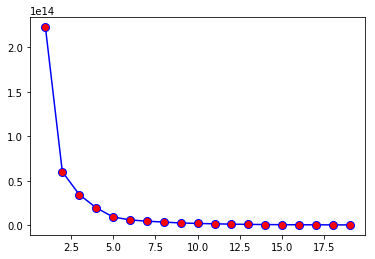

In [117]:
plt.plot(list(sum_square.keys()), list(sum_square.values()),
         linestyle ='-', marker = 'o', color = 'b',
         markersize = 8,markerfacecolor = 'r')

### Clustering with 5 centers

In [118]:
kmeans_5 = KMeans(n_clusters=5, random_state=0).fit(X_)
print('Cluster model K=5 inertia score is: ', kmeans_5.inertia_)
y=kmeans_5.predict(X_)

Cluster model K=5 inertia score is:  9442019253099.459


In [119]:
centers5 = kmeans_5.cluster_centers_
centers5

array([[ 3.70484804e-01,  7.26679962e+01,  1.57229746e+03,
         3.96584462e+00,  4.79164092e+00,  2.33559912e+00,
         1.62030223e+00,  9.89070299e+03,  5.00653608e+01,
         9.41849648e+01,  8.07585136e+02,  1.46210887e+00,
         2.53148700e+00,  1.83287006e+02],
       [ 7.54951657e-15,  4.94154930e+01,  1.36783223e+03,
         1.16570008e+00,  4.96313173e+00,  4.04929577e+00,
         2.38235294e+00,  2.02125922e+05,  4.68516951e+01,
         7.50748191e+01,  7.68048467e+02,  2.99875725e+00,
         2.66487158e+00,  1.89386495e+02],
       [ 3.21964677e-15,  3.43187430e+01,  1.08534792e+03,
         1.21773288e+00,  4.95622896e+00,  5.00000000e+00,
         3.35353535e+00,  3.55193639e+05,  4.88487670e+01,
         7.59115510e+01,  7.62613917e+02,  3.00000000e+00,
         2.53086420e+00,  1.88261504e+02],
       [ 6.19962802e-04,  6.01898636e+01,  1.71748140e+03,
         1.36500310e+00,  4.95474272e+00,  4.00000000e+00,
         2.21171730e+00,  6.59763625e+04,  4.

In [120]:
X_['klabels_5'] = kmeans_5.labels_

In [121]:
df.columns

Index(['AircraftTypeID', 'AircraftMakeID', 'OrganizationID', 'OperationTypeID',
       'OperatorTypeID', 'WeightCategoryID', 'NumberOfEngine',
       'MaxTakeOffWeight', 'Latitude', 'Longitude', 'OccTime',
       'WakeTurbulenceCategoryID', 'DangerousGoodEnum', 'PhaseID',
       'OccTypeID'],
      dtype='object')

In [122]:
X_.head()
#X_.shape

,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID,klabels_5
181463,2,77,775,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,662,1.0,2.0,108.0,0
181461,0,30,272,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,792,1.0,2.0,218.0,0
181460,0,63,314,3.0,5.0,1.0,1.0,2150.0,51.483333,55.816667,1082,1.0,2.0,194.0,0
181455,0,37,272,1.0,5.0,3.0,1.0,8000.0,53.500000,55.833333,572,2.0,2.0,194.0,0
181453,0,37,272,1.0,5.0,2.0,1.0,2313.0,53.316667,60.433333,1001,1.0,2.0,194.0,0


In [123]:
# Y=dfa["OccTypeID"]
# y is your prediction
# compare y and Y in the metrics

In [124]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(df['OccTypeID'], kmeans_5.labels_))

             precision    recall  f1-score   support

          0       0.00      0.00      0.00         0
          1       0.02      0.00      0.01      8427
          2       0.00      0.00      0.00         0
          3       0.98      0.33      0.49     19238
          4       0.00      0.00      0.00         0

avg / total       0.69      0.23      0.35     27665



In [125]:
X_.klabels_5.value_counts()

0    17801
3     6452
1     2414
2      891
4      107
Name: klabels_5, dtype: int64

In [126]:
df.OccTypeID.value_counts()

3    19238
1     8427
Name: OccTypeID, dtype: int64

### Clustering with 4 centers

In [127]:
kmeans_4 = KMeans(n_clusters=4, random_state=0).fit(X_)
print('Cluster model K=4 inertia score is: ', kmeans_4.inertia_)
y=kmeans_4.predict(X_)

Cluster model K=4 inertia score is:  19810963953810.234


In [128]:
centers4 = kmeans_4.cluster_centers_
centers4

array([[ 3.70484804e-01,  7.26679962e+01,  1.57229746e+03,
         3.96584462e+00,  4.79164092e+00,  2.33559912e+00,
         1.62030223e+00,  9.89070299e+03,  5.00653608e+01,
         9.41849648e+01,  8.07585136e+02,  1.46210887e+00,
         2.53148700e+00,  1.83287006e+02, -3.31068506e-13],
       [ 7.63278329e-15,  4.86735669e+01,  1.36529857e+03,
         1.16401274e+00,  4.96178344e+00,  4.08757962e+00,
         2.38335987e+00,  2.05702898e+05,  4.69173174e+01,
         7.50907925e+01,  7.65103105e+02,  3.00000000e+00,
         2.66480892e+00,  1.89288615e+02,  1.04020701e+00],
       [ 3.24740235e-15,  3.58472687e+01,  1.06626198e+03,
         1.25863991e+00,  4.96544036e+00,  5.00000000e+00,
         3.50613155e+00,  4.02761817e+05,  4.87560187e+01,
         7.58459676e+01,  7.73781494e+02,  3.00000000e+00,
         2.46711260e+00,  1.88508361e+02,  2.23857302e+00],
       [ 6.19674671e-04,  6.01730442e+01,  1.71785252e+03,
         1.36483346e+00,  4.95476375e+00,  4.00000000

In [129]:
X_['klabels_4'] = kmeans_4.labels_

In [130]:
df.columns

Index(['AircraftTypeID', 'AircraftMakeID', 'OrganizationID', 'OperationTypeID',
       'OperatorTypeID', 'WeightCategoryID', 'NumberOfEngine',
       'MaxTakeOffWeight', 'Latitude', 'Longitude', 'OccTime',
       'WakeTurbulenceCategoryID', 'DangerousGoodEnum', 'PhaseID',
       'OccTypeID'],
      dtype='object')

In [131]:
X_.head()
#X_.shape

,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID,klabels_5,klabels_4
181463,2,77,775,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,662,1.0,2.0,108.0,0,0
181461,0,30,272,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,792,1.0,2.0,218.0,0,0
181460,0,63,314,3.0,5.0,1.0,1.0,2150.0,51.483333,55.816667,1082,1.0,2.0,194.0,0,0
181455,0,37,272,1.0,5.0,3.0,1.0,8000.0,53.500000,55.833333,572,2.0,2.0,194.0,0,0
181453,0,37,272,1.0,5.0,2.0,1.0,2313.0,53.316667,60.433333,1001,1.0,2.0,194.0,0,0


In [132]:
# Y=dfa["OccTypeID"]
# y is your prediction
# compare y and Y in the metrics

In [133]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(df['OccTypeID'], kmeans_4.labels_))

             precision    recall  f1-score   support

          0       0.00      0.00      0.00         0
          1       0.02      0.01      0.01      8427
          2       0.00      0.00      0.00         0
          3       0.98      0.33      0.49     19238

avg / total       0.69      0.23      0.35     27665



In [134]:
print(confusion_matrix(df['OccTypeID'], kmeans_4.labels_))

[[   0    0    0    0]
 [8236   43   34  114]
 [   0    0    0    0]
 [9565 2469  863 6341]]


In [135]:
from sklearn.metrics import accuracy_score
accuracy_score(df.OccTypeID, kmeans_4.labels_)

0.2307608892101934

In [136]:
X_.klabels_4.value_counts()

0    17801
3     6455
1     2512
2      897
Name: klabels_4, dtype: int64

In [137]:
df.OccTypeID.value_counts()

3    19238
1     8427
Name: OccTypeID, dtype: int64

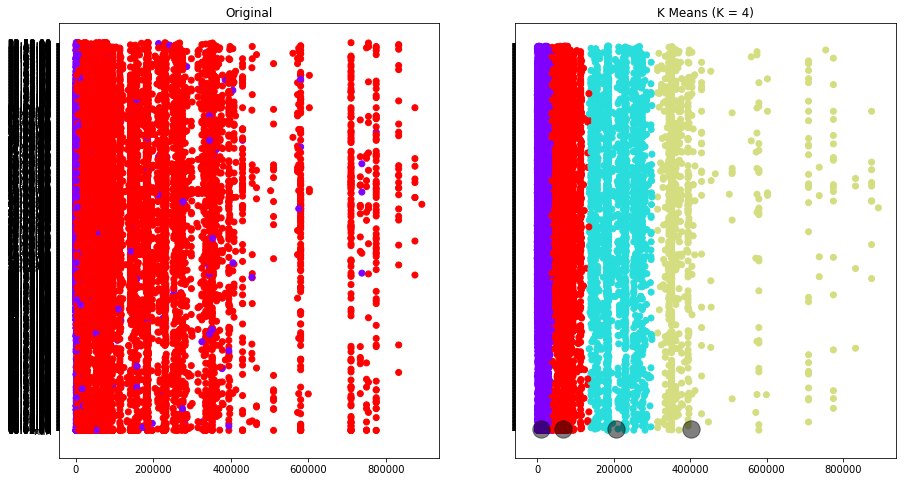

In [138]:
f, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2,
                             sharey = True, figsize = (15,8))

# For original data 
ax1.set_title("Original")
ax1.scatter(x = dfm['MaxTakeOffWeight'], y = dfm['OccTime'], 
            c = dfm['OccTypeID'], cmap='rainbow')


# For fitted with kmeans 
ax2.set_title('K Means (K = 4)')
ax2.scatter(x = X_['MaxTakeOffWeight'], y = X_['OccTime'], 
            c = X_['klabels_4'], cmap='rainbow')
ax2.scatter(x=centers4[:, 7], y=centers4[:, 5],
            c='black',s=300, alpha=0.5);



### Clustering with 3 centers

In [139]:
kmeans_3 = KMeans(n_clusters=3, random_state=0).fit(X_)
print('Cluster model K=4 inertia score is: ', kmeans_3.inertia_)
y=kmeans_3.predict(X_)

Cluster model K=4 inertia score is:  34602855413230.465


In [140]:
centers3 = kmeans_3.cluster_centers_
centers3

array([[2.74375286e-01, 6.96952310e+01, 1.60748796e+03, 3.29212923e+00,
        4.83389464e+00, 2.76811775e+00, 1.77543553e+00, 2.40555619e+04,
        4.91801607e+01, 9.39143973e+01, 8.08572034e+02, 1.60188766e+00,
        2.57207601e+00, 1.85416033e+02, 7.79593364e-01, 7.79593364e-01],
       [7.82707232e-15, 4.71137284e+01, 1.41521605e+03, 1.15973500e+00,
        4.96245859e+00, 4.08097166e+00, 2.35737946e+00, 1.98864283e+05,
        4.68587155e+01, 7.52466319e+01, 7.64782481e+02, 2.92454914e+00,
        2.66691204e+00, 1.88997056e+02, 1.18586676e+00, 1.15090173e+00],
       [3.24740235e-15, 3.58472687e+01, 1.06626198e+03, 1.25863991e+00,
        4.96544036e+00, 5.00000000e+00, 3.50613155e+00, 4.02761817e+05,
        4.87560187e+01, 7.58459676e+01, 7.73781494e+02, 3.00000000e+00,
        2.46711260e+00, 1.88508361e+02, 2.23857302e+00, 2.00000000e+00]])

In [141]:
X_['klabels_3'] = kmeans_3.labels_

In [142]:
df.columns

Index(['AircraftTypeID', 'AircraftMakeID', 'OrganizationID', 'OperationTypeID',
       'OperatorTypeID', 'WeightCategoryID', 'NumberOfEngine',
       'MaxTakeOffWeight', 'Latitude', 'Longitude', 'OccTime',
       'WakeTurbulenceCategoryID', 'DangerousGoodEnum', 'PhaseID',
       'OccTypeID'],
      dtype='object')

In [143]:
X_.head()
#X_.shape

,AircraftTypeID,AircraftMakeID,OrganizationID,OperationTypeID,OperatorTypeID,WeightCategoryID,NumberOfEngine,MaxTakeOffWeight,Latitude,Longitude,OccTime,WakeTurbulenceCategoryID,DangerousGoodEnum,PhaseID,klabels_5,klabels_4,klabels_3
181463,2,77,775,9.0,5.0,2.0,1.0,2550.0,48.050000,54.833333,662,1.0,2.0,108.0,0,0,0
181461,0,30,272,1.0,5.0,2.0,1.0,2800.0,53.566667,64.100000,792,1.0,2.0,218.0,0,0,0
181460,0,63,314,3.0,5.0,1.0,1.0,2150.0,51.483333,55.816667,1082,1.0,2.0,194.0,0,0,0
181455,0,37,272,1.0,5.0,3.0,1.0,8000.0,53.500000,55.833333,572,2.0,2.0,194.0,0,0,0
181453,0,37,272,1.0,5.0,2.0,1.0,2313.0,53.316667,60.433333,1001,1.0,2.0,194.0,0,0,0


In [144]:
# Y=dfa["OccTypeID"]
# y is your prediction
# compare y and Y in the metrics

In [145]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(df['OccTypeID'], kmeans_3.labels_))

             precision    recall  f1-score   support

          0       0.00      0.00      0.00         0
          1       0.02      0.01      0.01      8427
          2       0.00      0.00      0.00         0
          3       0.00      0.00      0.00     19238

avg / total       0.01      0.00      0.00     27665



In [146]:
print(confusion_matrix(df['OccTypeID'], kmeans_3.labels_))

[[    0     0     0     0]
 [ 8346    47    34     0]
 [    0     0     0     0]
 [15705  2670   863     0]]


In [147]:
X_.klabels_3.value_counts()

0    24051
1     2717
2      897
Name: klabels_3, dtype: int64

In [148]:
df.OccTypeID.value_counts()

3    19238
1     8427
Name: OccTypeID, dtype: int64